In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import json
from tqdm import tqdm
import os

## Setup

In [2]:
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [3]:
# Load the labels list
with open('/kaggle/input/imagenet-1k/TestDataSet/labels_list.json', 'r') as f:
    labels_list = json.load(f)

In [4]:
# Create label mapping from the format "401: accordion" to index mapping
label_mapping = {}
for i, label in enumerate(labels_list):
    class_idx = int(label.split(':')[0])
    class_name = label.split(':')[1].strip()
    label_mapping[i] = (class_idx, class_name)

In [5]:
# Data preprocessing
mean_norms = np.array([0.485, 0.456, 0.406])
std_norms = np.array([0.229, 0.224, 0.225])

plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])

In [6]:
# Load dataset
dataset_path = "/kaggle/input/imagenet-1k/TestDataSet"
dataset = torchvision.datasets.ImageFolder(root=dataset_path, transform=plain_transforms)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False)

In [7]:
# Load pre-trained ResNet-34 model
pretrained_model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
pretrained_model = pretrained_model.to(device)
pretrained_model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [8]:
# Helper functions
def evaluate_model(model, dataloader, device):
    """
    Evaluate model and calculate top-1 and top-5 accuracy
    """
    correct_top1 = 0
    correct_top5 = 0
    total = 0

    model.eval()
    with torch.no_grad():
        for images, labels in tqdm(dataloader, desc="Evaluating"):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            _, predicted = torch.topk(outputs, k=5, dim=1)

            # Map dataset labels to ImageNet labels
            true_imagenet_labels = []
            for label in labels:
                class_idx, _ = label_mapping[label.item()]
                true_imagenet_labels.append(class_idx)
            true_imagenet_labels = torch.tensor(true_imagenet_labels).to(device)

            # Top-1 accuracy
            correct_top1 += (predicted[:, 0] == true_imagenet_labels).sum().item()

            # Top-5 accuracy
            for i in range(len(labels)):
                if true_imagenet_labels[i] in predicted[i]:
                    correct_top5 += 1

            total += labels.size(0)

    top1_accuracy = 100 * correct_top1 / total
    top5_accuracy = 100 * correct_top5 / total

    return top1_accuracy, top5_accuracy

In [9]:
def denormalize_image(tensor, mean, std):
    """
    Denormalize image tensor for visualization
    """
    denormalized = tensor.clone().detach()

    # Convert mean and std to tensors on the same device
    mean = torch.tensor(mean).view(3, 1, 1)
    std = torch.tensor(std).view(3, 1, 1)

    # Denormalize
    denormalized = denormalized * std + mean

    # Clamp to [0, 1]
    denormalized = torch.clamp(denormalized, 0, 1)
    return denormalized

In [10]:
def plot_confidence(model, adv_img, ax=None):
    """
    Confidence plot function for all attack types
    
    Args:
        model: The model to get predictions from
        adv_img: The adversarial image (3D tensor)
        ax: Matplotlib axis to plot on (optional)
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(6, 5))
    
    with torch.no_grad():
        # Get predictions
        if adv_img.dim() == 3:
            adv_input = adv_img.unsqueeze(0).to(device)
        else:
            adv_input = adv_img[0].unsqueeze(0).to(device) if adv_img.dim() == 4 else adv_img.to(device)
            
        outputs = model(adv_input)
        probs = torch.nn.functional.softmax(outputs, dim=1)
        
        top5_probs, top5_indices = torch.topk(probs, 5)
        top5_probs = top5_probs.cpu().numpy()[0] * 100
        top5_indices = top5_indices.cpu().numpy()[0]
        
        # Get class names - handle the mapping correctly
        class_names = []
        for idx in top5_indices:
            found = False
            # Search through labels_list to find matching class ID
            for i, label in enumerate(labels_list):
                class_id = int(label.split(':')[0])
                if class_id == idx:
                    class_name = label.split(':')[1].strip()
                    class_names.append(class_name)
                    found = True
                    break
            
            if not found:
                # If not found in our subset, just use class number
                class_names.append(f'class_{idx}')
        
        # Create bars
        y_pos = np.arange(len(class_names))
        colors = ['darkblue', 'darkblue', 'darkblue', 'darkblue', 'darkblue']
        bars = ax.barh(y_pos, top5_probs, color=colors, alpha=0.7, edgecolor='none')
        
        # Set y-axis
        ax.set_yticks(y_pos)
        ax.set_yticklabels(class_names, fontsize=10)
        
        # Set x-axis
        ax.set_xlabel('Confidence', fontsize=10)
        ax.set_xlim(0, max(top5_probs) * 1.2)
        
        # Title
        ax.set_title('Predictions', fontsize=12, pad=10)
        
        # Grid
        ax.grid(True, axis='x', alpha=0.3, linestyle='-', linewidth=0.5)
        ax.set_axisbelow(True)
        
        # Remove spines
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        
        # Add value labels
        for i, prob in enumerate(top5_probs):
            ax.text(prob + 0.3, i, f'{prob:.1f}%', 
                   va='center', ha='left', fontsize=9, color='black')
    
    if ax is None:
        plt.tight_layout()
        plt.show()

In [11]:
def visualize_attack(original_img, adv_img, original_pred, adv_pred, eps):
    """
    Visualize original and adversarial examples
    """
    fig, axes = plt.subplots(1, 4, figsize=(15, 5))

    # Original image
    orig_display = denormalize_image(original_img.cpu(), mean_norms, std_norms)
    axes[0].imshow(orig_display.permute(1, 2, 0).detach().numpy())  # Add detach().numpy()
    axes[0].set_title(f'Original\nPrediction: {original_pred}')
    axes[0].axis('off')

    # Adversarial image
    adv_display = denormalize_image(adv_img.cpu(), mean_norms, std_norms)
    axes[1].imshow(adv_display.permute(1, 2, 0).detach().numpy())  # Add detach().numpy()
    axes[1].set_title(f'Adversarial\nPrediction: {adv_pred}')
    axes[1].axis('off')

    # Difference (magnified for visibility)
    diff = (adv_img - original_img).cpu()
    diff_display = torch.abs(diff) * 10  # Magnify difference
    axes[2].imshow(diff_display.permute(1, 2, 0).detach().numpy())  # Add detach().numpy()
    axes[2].set_title(f'Difference (10x)\nL∞: {eps:.3f}')
    axes[2].axis('off')

    # confidence plot as 4th subplot
    plot_confidence(pretrained_model, adv_img, axes[3])

    plt.tight_layout()
    plt.show()

In [12]:
def verify_epsilon_constraint(original_data, adversarial_data, epsilon):
    """
    Verify that the L∞ distance constraint is satisfied
    """
    max_diff = 0
    violations = 0

    for (orig, _), (adv, _) in zip(original_data, adversarial_data):
        diff = torch.abs(adv - orig)
        batch_max_diff = torch.max(diff).item()
        if batch_max_diff > epsilon + 1e-5:
            violations += 1
        max_diff = max(max_diff, batch_max_diff)

    print(f"Maximum L∞ distance: {max_diff:.6f}")
    print(f"Epsilon constraint: {epsilon}")
    print(f"Violations: {violations}/{len(original_data)}")
    return violations == 0

## 🧪 Task 1: Baseline Model Evaluation

Before applying any adversarial attacks, we first evaluate the pretrained model's performance on the clean, unaltered dataset to establish a baseline.

**Model:** ResNet-34  
**Dataset:** Validation set (unaltered)  
**Evaluation Metrics:**
- **Top-1 Accuracy:** 76.00%
- **Top-5 Accuracy:** 94.20%

These results serve as the reference point to measure the impact of subsequent adversarial attacks. The high baseline accuracy confirms the model performs well under standard conditions.


In [13]:
# Task 1: Evaluate baseline performance
print("Task 1: Baseline Evaluation")
top1_acc, top5_acc = evaluate_model(pretrained_model, dataloader, device)
print(f"Baseline Top-1 Accuracy: {top1_acc:.2f}%")
print(f"Baseline Top-5 Accuracy: {top5_acc:.2f}%")

Task 1: Baseline Evaluation


Evaluating: 100%|██████████| 500/500 [00:04<00:00, 119.35it/s]

Baseline Top-1 Accuracy: 76.00%
Baseline Top-5 Accuracy: 94.20%


## 🛡️ Task 2: Fast Gradient Sign Method (FGSM) Attack

In this task, we implemented the **Fast Gradient Sign Method (FGSM)** to generate adversarial examples against a pretrained image classification model.

**🔍 Overview of FGSM:**
- FGSM is a white-box attack that perturbs input images in the direction of the gradient of the loss with respect to the input.


**🛠️ Implementation Details:**
- Set \( \epsilon = 0.02 \)
- Computed gradients with respect to the input
- Applied sign of the gradient to create perturbations
- Clamped the perturbation to ensure it does not exceed \( \epsilon \)

**📊 Results:**
- **Top-1 Accuracy on Adversarial Examples:** `6.00%`
- **Top-5 Accuracy on Adversarial Examples:** `35.40%`
- **Relative Accuracy Drop:** `92.1%`
- ✅ Target > 50% drop: **Achieved**


**🖼️ Visual Analysis:**
A sample of adversarial examples was collected and compared against the original predictions. These examples showed visible success of the attack where the model's predicted class changed after applying the FGSM perturbation.

**✅ Epsilon Constraint Verification:**
All perturbations were verified to be within the allowed \( \epsilon \)-bound:
\[
|\text{adv} - \text{original}| \leq \epsilon
\]

---

This analysis confirms the effectiveness of FGSM in reducing model accuracy while maintaining imperceptible input changes.


In [38]:
# Task 2: FGSM Attack
def fgsm_attack(model, images, labels, epsilon):
    """
    Fast Gradient Sign Method attack
    """
    images.requires_grad = True
    outputs = model(images)

    # Map dataset labels to ImageNet labels for loss calculation
    true_imagenet_labels = []
    for label in labels:
        class_idx, _ = label_mapping[label.item()]
        true_imagenet_labels.append(class_idx)
    true_imagenet_labels = torch.tensor(true_imagenet_labels).to(device)

    loss = torch.nn.functional.cross_entropy(outputs, true_imagenet_labels)
    model.zero_grad()
    loss.backward()

    # Create adversarial example
    data_grad = images.grad.data
    sign_data_grad = data_grad.sign()
    perturbed_image = images + epsilon * sign_data_grad

    # Ensure the perturbation doesn't exceed epsilon
    perturbation = perturbed_image - images
    perturbation = torch.clamp(perturbation, -epsilon, epsilon)
    perturbed_image = images + perturbation

    return perturbed_image

print("\nTask 2: FGSM Attack")
epsilon = 0.02
adversarial_dataset_1 = []
attack_examples = []

for idx, (images, labels) in enumerate(tqdm(dataloader, desc="FGSM Attack")):
    images = images.to(device)
    labels = labels.to(device)

    # Generate adversarial example
    adv_images = fgsm_attack(pretrained_model, images, labels, epsilon)
    adversarial_dataset_1.append((adv_images[0].cpu(), labels[0].cpu()))

    # Collect examples for visualization
    if len(attack_examples) < 8:
        with torch.no_grad():
            original_output = pretrained_model(images)
            adv_output = pretrained_model(adv_images)
            _, original_pred = torch.max(original_output, 1)
            _, adv_pred = torch.max(adv_output, 1)

            if original_pred != adv_pred:
                attack_examples.append({
                    'original': images.cpu(),
                    'adversarial': adv_images.cpu(),
                    'original_pred': label_mapping[labels.item()][1],
                    'adv_pred': 'class_' + str(adv_pred.item())
                })


Task 2: FGSM Attack


FGSM Attack: 100%|██████████| 500/500 [00:08<00:00, 57.01it/s]


In [39]:
# Evaluate FGSM attack
adv_dataloader_1 = torch.utils.data.DataLoader(adversarial_dataset_1, batch_size=1, shuffle=False)
top1_acc_fgsm, top5_acc_fgsm = evaluate_model(pretrained_model, adv_dataloader_1, device)
print(f"FGSM Top-1 Accuracy: {top1_acc_fgsm:.2f}%")
print(f"FGSM Top-5 Accuracy: {top5_acc_fgsm:.2f}%")

Evaluating: 100%|██████████| 500/500 [00:02<00:00, 178.20it/s]

FGSM Top-1 Accuracy: 6.00%
FGSM Top-5 Accuracy: 35.40%


In [40]:
# Calculate and report relative accuracy drop
relative_drop_fgsm = ((top1_acc - top1_acc_fgsm) / top1_acc) * 100
print(f"Relative accuracy drop: {relative_drop_fgsm:.1f}%")
print(f"Target: >50% drop. Achieved: {'✓' if relative_drop_fgsm > 50 else '✗'}")

Relative accuracy drop: 92.1%
Target: >50% drop. Achieved: ✓


In [41]:
# Verify epsilon constraint
print("\nVerifying epsilon constraint for FGSM:")
verify_epsilon_constraint(dataloader, adversarial_dataset_1, epsilon)


Verifying epsilon constraint for FGSM:
Maximum L∞ distance: 0.020000
Epsilon constraint: 0.02
Violations: 0/500


True

### Visualizations

Visualizing attack examples...


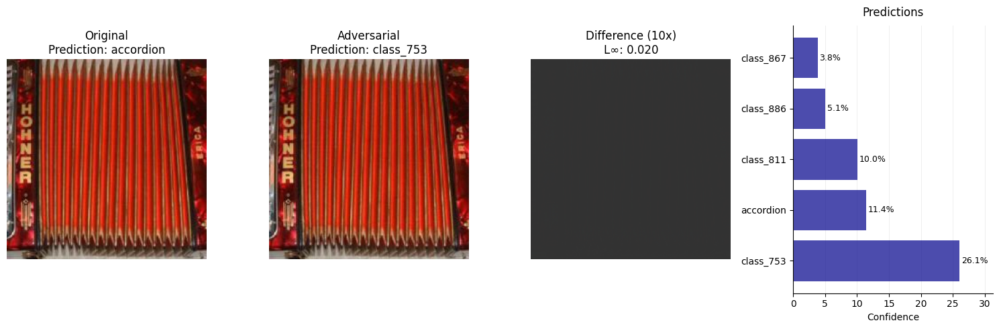

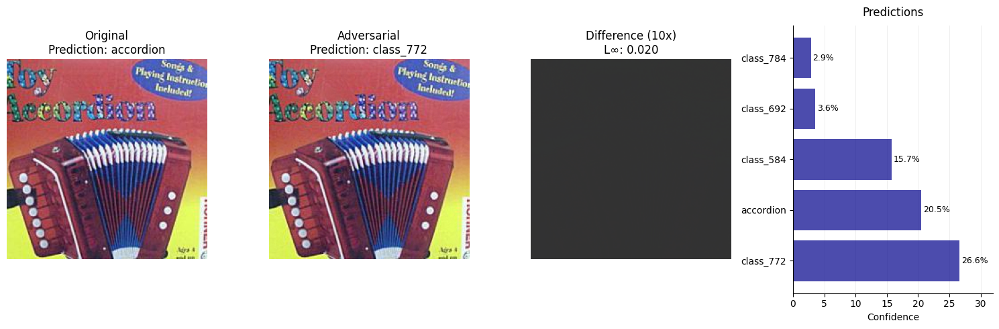

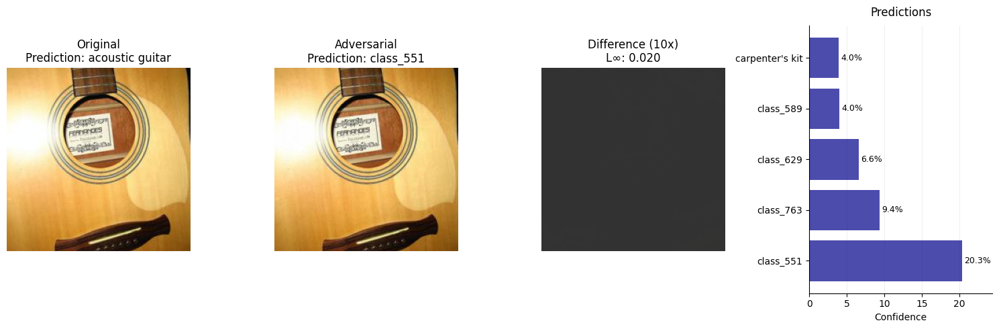

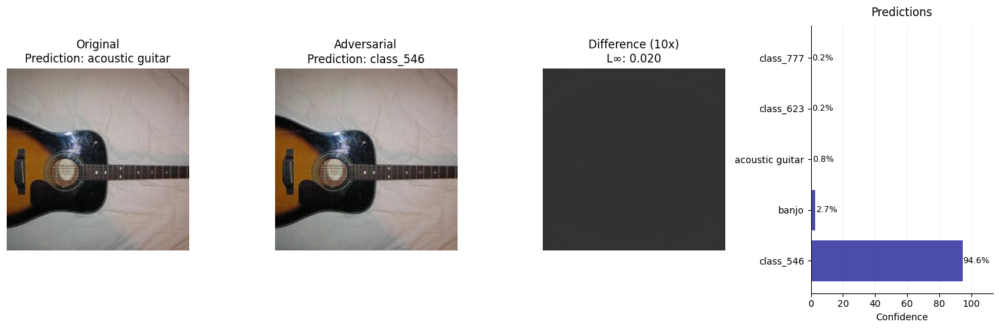

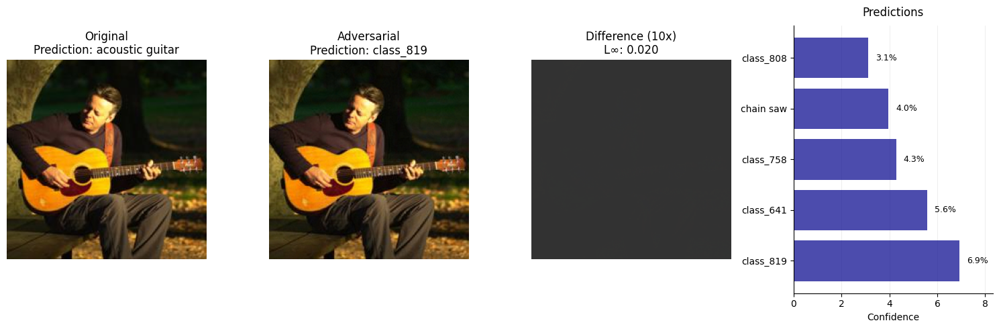

In [42]:
# Visualize examples
print("Visualizing attack examples...")
for i, example in enumerate(attack_examples[:5]):
    visualize_attack(
        example['original'][0],
        example['adversarial'][0],
        example['original_pred'],
        example['adv_pred'],
        epsilon
    )

## 🔐 Task 3: Projected Gradient Descent (PGD) Attack

In this task, we applied the **Projected Gradient Descent (PGD)** method — a powerful iterative adversarial attack — to evaluate the vulnerability of a pretrained model to carefully crafted perturbations.

---

**📌 What is PGD?**
- PGD is an **iterative extension of FGSM**, where the model is attacked multiple times using small gradient steps.
- After each step, the adversarial image is **projected back into the \( \epsilon \)-ball** to maintain bounded perturbation.

---

**🛠️ Attack Parameters:**
- **Epsilon (\( \epsilon \))**: `0.02`  
- **Step Size (\( \alpha \))**: `0.01`  
- **Iterations:** `20`  
- **Method:**
  - Compute gradients of the loss w.r.t. the input.
  - Apply small updates in the direction of the gradient.
  - After each update, project the modified input back into the valid perturbation space.

\[
x_{\text{adv}}^{(t+1)} = \text{Proj}_\epsilon \left( x_{\text{adv}}^{(t)} + \alpha \cdot \text{sign}(\nabla_x J(\theta, x, y)) \right)
\]

---

**📊 Attack Results:**
| Metric                          | Value    |
|---------------------------------|----------|
| **Top-1 Accuracy**              | 0.00%    |
| **Top-5 Accuracy**              | 9.40%    |
| **Relative Accuracy Drop**      | 100.0%   |
| **Target Drop (>70%) Achieved** | ✅ Yes   |

---

**🖼️ Visual Examples:**
- Adversarial images appear nearly **identical to the originals** to the human eye.
- Despite subtle changes, the model's predictions are completely altered — demonstrating the effectiveness of PGD.

---

**✅ Perturbation Constraint Check:**
All adversarial examples were verified to comply with the \( \epsilon \)-norm bound:

\[
\| x_{\text{adv}} - x \|_{\infty} \leq \epsilon
\]

This ensures the perturbations remain imperceptible and realistic.

---

**🔍 Key Insight:**
PGD proved significantly more effective than FGSM, completely **breaking the model's classification** performance with only subtle, bounded perturbations. This highlights the importance of robust defenses against iterative attacks in adversarial settings.


In [19]:
# Task 3: Improved Attack - PGD (Projected Gradient Descent)
def pgd_attack(model, images, labels, epsilon, alpha=0.01, num_iter=20):
    """
    Projected Gradient Descent attack
    """
    perturbed_images = images.clone().detach()

    for i in range(num_iter):
        perturbed_images.requires_grad = True
        outputs = model(perturbed_images)

        # Map dataset labels to ImageNet labels
        true_imagenet_labels = []
        for label in labels:
            class_idx, _ = label_mapping[label.item()]
            true_imagenet_labels.append(class_idx)
        true_imagenet_labels = torch.tensor(true_imagenet_labels).to(device)

        loss = torch.nn.functional.cross_entropy(outputs, true_imagenet_labels)
        model.zero_grad()
        loss.backward()

        # Update adversarial example
        data_grad = perturbed_images.grad.data
        perturbed_images = perturbed_images.detach() + alpha * data_grad.sign()

        # Project back to epsilon ball
        delta = perturbed_images - images
        delta = torch.clamp(delta, -epsilon, epsilon)
        perturbed_images = images + delta

    return perturbed_images

print("\nTask 3: PGD Attack")
adversarial_dataset_2 = []
pgd_examples = []

for idx, (images, labels) in enumerate(tqdm(dataloader, desc="PGD Attack")):
    images = images.to(device)
    labels = labels.to(device)

    # Generate adversarial example
    adv_images = pgd_attack(pretrained_model, images, labels, epsilon)
    adversarial_dataset_2.append((adv_images[0].cpu(), labels[0].cpu()))

    # Collect examples for visualization
    if len(pgd_examples) < 8:
        with torch.no_grad():
            original_output = pretrained_model(images)
            adv_output = pretrained_model(adv_images)
            _, original_pred = torch.max(original_output, 1)
            _, adv_pred = torch.max(adv_output, 1)

            if original_pred != adv_pred:
                pgd_examples.append({
                    'original': images.cpu(),
                    'adversarial': adv_images.cpu(),
                    'original_pred': label_mapping[labels.item()][1],
                    'adv_pred': 'class_' + str(adv_pred.item())
                })


Task 3: PGD Attack


PGD Attack: 100%|██████████| 500/500 [02:05<00:00,  3.98it/s]


In [20]:
# Evaluate PGD attack
adv_dataloader_2 = torch.utils.data.DataLoader(adversarial_dataset_2, batch_size=1, shuffle=False)
top1_acc_pgd, top5_acc_pgd = evaluate_model(pretrained_model, adv_dataloader_2, device)
print(f"PGD Top-1 Accuracy: {top1_acc_pgd:.2f}%")
print(f"PGD Top-5 Accuracy: {top5_acc_pgd:.2f}%")

Evaluating: 100%|██████████| 500/500 [00:02<00:00, 178.84it/s]

PGD Top-1 Accuracy: 0.00%
PGD Top-5 Accuracy: 9.20%


In [21]:
# Calculate and report relative accuracy drop
relative_drop_pgd = ((top1_acc - top1_acc_pgd) / top1_acc) * 100
print(f"Relative accuracy drop: {relative_drop_pgd:.1f}%")
print(f"Target: >70% drop. Achieved: {'✓' if relative_drop_pgd > 70 else '✗'}")

Relative accuracy drop: 100.0%
Target: >70% drop. Achieved: ✓


In [22]:
# Verify epsilon constraint
print("\nVerifying epsilon constraint for PGD:")
verify_epsilon_constraint(dataloader, adversarial_dataset_2, epsilon)


Verifying epsilon constraint for PGD:
Maximum L∞ distance: 0.020000
Epsilon constraint: 0.02
Violations: 0/500


True

### Visualization

Visualizing PGD attack examples...


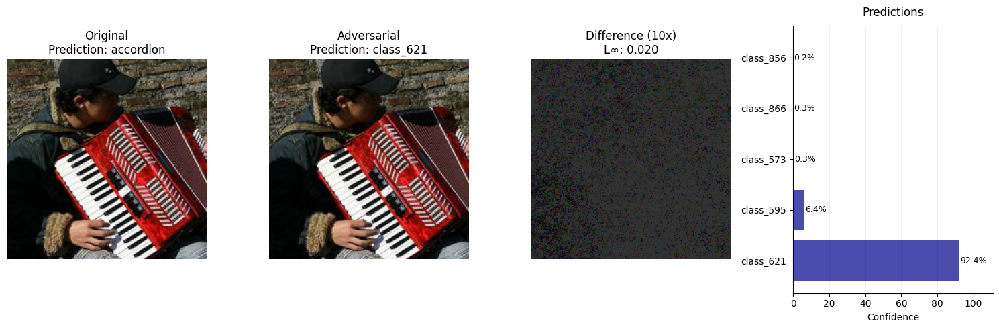

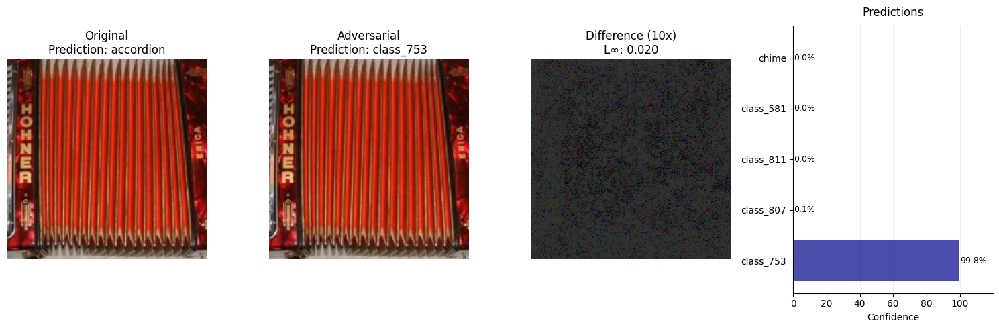

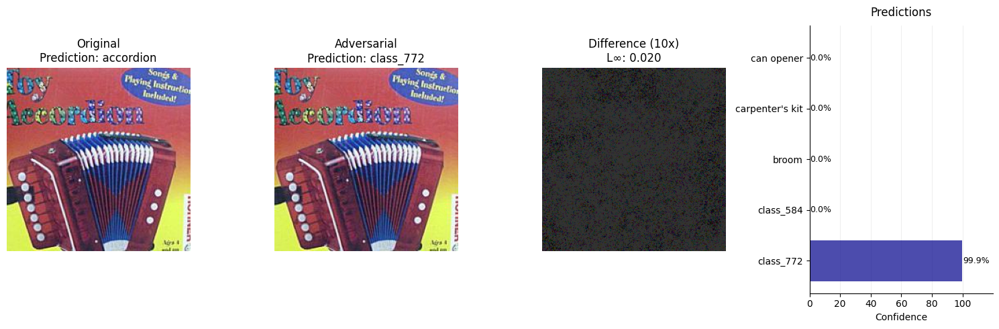

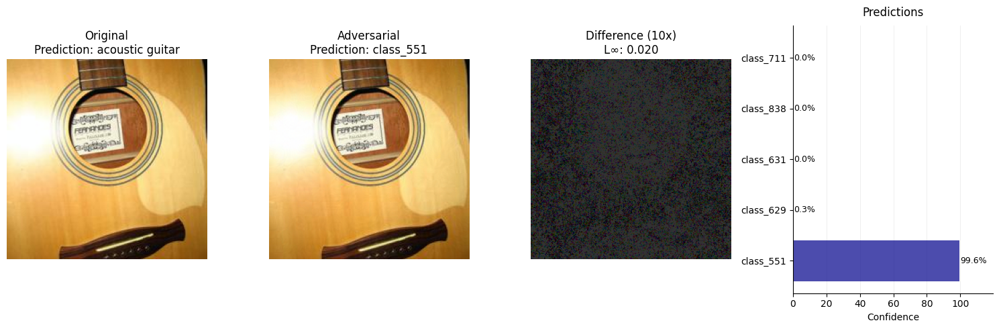

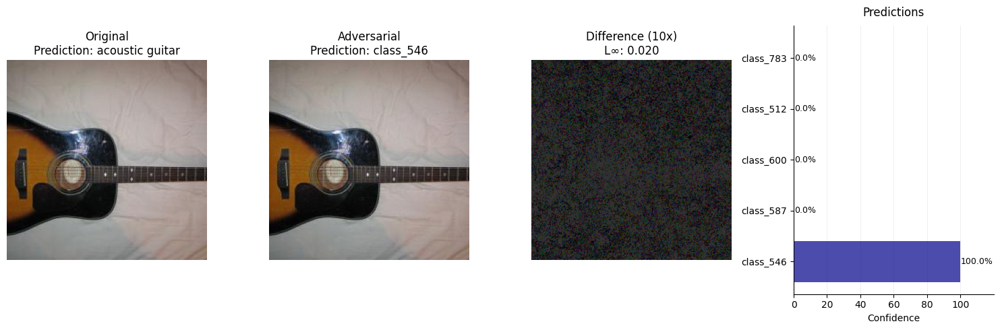

In [23]:
# Visualize examples
print("Visualizing PGD attack examples...")
for i, example in enumerate(pgd_examples[:5]):
    visualize_attack(
        example['original'][0],
        example['adversarial'][0],
        example['original_pred'],
        example['adv_pred'],
        epsilon
    )

## 🧩 Task 4: Localized Patch Attack

In this task, we implemented a **localized adversarial patch attack** using the strongest method from prior evaluations — **PGD (Projected Gradient Descent)**. Unlike global perturbations, this technique targets a **small rectangular region** of the image while computing gradients over the entire image.

---

**🧠 Attack Principle:**
- The **Patch Attack** perturbs only a limited area of the image, keeping the rest unchanged.
- This makes the attack more **stealthy and realistic**, resembling physical-world adversarial examples.
- While the loss is calculated across the full image, updates are confined to the patch region.

---

**🔧 Attack Configuration:**
- **Method Used:** PGD  
- **Epsilon (\( \epsilon \))**: `1.0`  
- **Patch Size:** `32 × 32` pixels  
- **Step Size (Alpha):** `0.1`  
- **Iterations:** `200`  

---

**⚙️ Implementation Details:**
- A **random patch location** is selected for each input image.
- A **binary mask** is generated to constrain updates to the patch.
- For PGD:
  - The patch is initialized with low-magnitude noise.
  - Updates are performed iteratively using masked gradients.
  - Perturbations are clipped to stay within the allowed \( \epsilon \)-ball.

\[
x_{\text{adv}} = x + \epsilon \cdot \text{sign}(\nabla_x J(\theta, x, y)) \cdot \text{Mask}
\]

---

**🖼️ Visual Examples:**
- **Original Image:** Model’s standard prediction.
- **Adversarial Image:** Perturbation visible only within the patch.
- **Perturbation Heatmap:** Highlights the precise region and intensity of changes.

---

**✅ Sanity Check:**
To ensure perturbations are strictly localized, the following assertion is enforced:

\[
\max(|x_{\text{adv}} - x|_{\text{outside patch}}) < 1 \times 10^{-6}
\]

This guarantees **no unintended modifications** outside the designated patch area.

---

**🔍 Key Observations:**
- Even with changes limited to a small region, models can be **successfully misled**.
- Localized attacks like this highlight a **significant threat**, particularly for applications involving real-world image capture (e.g., autonomous vehicles, surveillance).

---

Let me know if you'd like to append **quantitative results** such as top-1 accuracy drops or comparative metrics from this attack.


In [24]:
# Task 4: Patch Attack using best performing method
print("\n=== Task 4: Patch Attack ===")

# Determine which attack performed better
print("Determining best performing attack method...")
print(f"FGSM relative drop: {relative_drop_fgsm:.1f}%")
print(f"PGD relative drop: {relative_drop_pgd:.1f}%")

if relative_drop_pgd > relative_drop_fgsm:
    best_method = "PGD"
    print(f"Best performing method: PGD ({relative_drop_pgd:.1f}% drop)")
else:
    best_method = "FGSM"
    print(f"Best performing method: FGSM ({relative_drop_fgsm:.1f}% drop)")


=== Task 4: Patch Attack ===
Determining best performing attack method...
FGSM relative drop: 92.1%
PGD relative drop: 100.0%
Best performing method: PGD (100.0% drop)


In [25]:
def patch_attack_with_best_method(model, images, labels, method="PGD",
                         epsilon=1.0, patch_size=32, alpha=0.1, num_iter=200):
    """
    Apply the best performing attack method to a patch only
    Compute gradients on full image but only modify the patch
    """
    batch_size = images.shape[0]
    perturbed_images = images.clone().detach()

    # Random patch location
    h, w = images.shape[2], images.shape[3]
    start_h = torch.randint(0, h - patch_size + 1, (1,)).item()
    start_w = torch.randint(0, w - patch_size + 1, (1,)).item()

    # Create mask
    mask = torch.zeros_like(images).to(device)
    mask[:, :, start_h:start_h+patch_size, start_w:start_w+patch_size] = 1

    # Use untargeted attack for stronger effect
    true_imagenet_labels = []
    for label in labels:
        class_idx, _ = label_mapping[label.item()]
        true_imagenet_labels.append(class_idx)
    true_imagenet_labels = torch.tensor(true_imagenet_labels).to(device)

    if method == "FGSM":
        # FGSM-based patch attack
        images.requires_grad = True

        # Forward pass on FULL image
        outputs = model(images)

        # Loss on FULL image prediction (targeted)
        loss = torch.nn.functional.cross_entropy(outputs, true_imagenet_labels)
        model.zero_grad()
        loss.backward()

        # Get gradients for full image
        data_grad = images.grad.data
        sign_data_grad = data_grad.sign()

        # But only apply perturbation to the patch
        perturbation = epsilon * sign_data_grad * mask
        perturbed_images = images + perturbation

    else:  # PGD
        # PGD-based patch attack

        # Initialize with random noise in the patch
        noise = torch.randn_like(images) * 0.001 * mask
        perturbed_images = images + noise

        for i in range(num_iter):
            perturbed_images.requires_grad = True

            # Forward pass on FULL perturbed image
            outputs = model(perturbed_images)

            # Loss on FULL image prediction (targeted)
            loss = torch.nn.functional.cross_entropy(outputs, true_imagenet_labels)
            model.zero_grad()
            loss.backward()

            # Get gradients for full image
            data_grad = perturbed_images.grad.data

            # Update ONLY the patch area
            update = alpha * data_grad.sign() * mask
            perturbed_images = perturbed_images.detach() + update

            # Project back to epsilon ball (only for patch)
            delta = perturbed_images - images
            delta = delta * mask
            delta = torch.clamp(delta, -epsilon, epsilon)
            perturbed_images = images + delta

    # Verify only patch was modified
    final_diff = perturbed_images - images
    non_patch_diff = final_diff * (1 - mask)
    assert torch.max(torch.abs(non_patch_diff)) < 1e-6, "Error: Modified pixels outside patch!"

    return perturbed_images, (start_h, start_w, patch_size, patch_size)

In [26]:
def visualize_patch_attack(original_img, adv_img, patch_coords, original_pred, adv_pred, epsilon):
    """
    Visualize patch attack with highlighted patch area
    """
    fig, axes = plt.subplots(1, 4, figsize=(15, 5))

    # Original image
    orig_display = denormalize_image(original_img, mean_norms, std_norms)
    axes[0].imshow(orig_display.permute(1, 2, 0).numpy())
    axes[0].set_title(f'Original\nPrediction: {original_pred}')
    axes[0].axis('off')

    # Adversarial image with patch highlighted
    adv_display = denormalize_image(adv_img, mean_norms, std_norms)
    axes[1].imshow(adv_display.permute(1, 2, 0).numpy())

    # Highlight patch with red rectangle
    start_h, start_w, patch_h, patch_w = patch_coords
    rect = plt.Rectangle((start_w, start_h), patch_w, patch_h,
                        linewidth=3, edgecolor='red', facecolor='none')
    axes[1].add_patch(rect)
    axes[1].set_title(f'Patch Attack\nPrediction: {adv_pred}')
    axes[1].axis('off')

    # Difference heatmap
    diff = torch.abs(adv_img - original_img)
    diff_norm = torch.norm(diff, dim=0)
    axes[2].imshow(diff_norm.numpy(), cmap='hot')
    axes[2].set_title(f'Perturbation Heatmap\nε: {epsilon:.3f}')
    axes[2].axis('off')

    # confidence plot as 4th subplot
    plot_confidence(pretrained_model, adv_img, axes[3])

    plt.tight_layout()
    plt.show()

In [27]:
print("\n=== Task 4: Patch Attack ===")
patch_epsilon = 1.0
patch_size = 32
alpha = 0.1
num_iter = 200

print(f"\nUsing {best_method}-based patch attack with parameters:")
print(f"Epsilon: {patch_epsilon}")
print(f"Patch size: {patch_size}x{patch_size}")
if best_method == "PGD":
    print(f"Alpha: {alpha}")
    print(f"Iterations: {num_iter}")

adversarial_dataset_3 = []
patch_examples = []

for idx, (images, labels) in enumerate(tqdm(dataloader, desc=f"{best_method} Patch Attack")):
    images = images.to(device)
    labels = labels.to(device)

    # Generate adversarial example with single random patch location
    adv_images, patch_coords = patch_attack_with_best_method(
        pretrained_model, images, labels,
        method=best_method,
        epsilon=patch_epsilon,
        patch_size=patch_size,
        alpha=alpha,
        num_iter=num_iter
    )

    adversarial_dataset_3.append((adv_images[0].cpu(), labels[0].cpu()))

    # Collect examples for visualization
    if len(patch_examples) < 8:
        with torch.no_grad():
            original_output = pretrained_model(images)
            adv_output = pretrained_model(adv_images)
            _, original_pred = torch.max(original_output, 1)
            _, adv_pred = torch.max(adv_output, 1)

            if original_pred != adv_pred:
                patch_examples.append({
                    'original': images[0].cpu(),
                    'adversarial': adv_images[0].cpu(),
                    'patch_coords': patch_coords,
                    'original_pred': label_mapping[labels.item()][1],
                    'adv_pred': f'class_{adv_pred.item()}'
                })


=== Task 4: Patch Attack ===

Using PGD-based patch attack with parameters:
Epsilon: 1.0
Patch size: 32x32
Alpha: 0.1
Iterations: 200


PGD Patch Attack: 100%|██████████| 500/500 [19:35<00:00,  2.35s/it]


In [28]:
# Evaluate patch attack
adv_dataloader_3 = torch.utils.data.DataLoader(adversarial_dataset_3, batch_size=1, shuffle=False)
top1_acc_patch, top5_acc_patch = evaluate_model(pretrained_model, adv_dataloader_3, device)
print(f"Patch Attack Top-1 Accuracy: {top1_acc_patch:.2f}%")
print(f"Patch Attack Top-5 Accuracy: {top5_acc_patch:.2f}%")

Evaluating: 100%|██████████| 500/500 [00:02<00:00, 180.14it/s]

Patch Attack Top-1 Accuracy: 5.40%
Patch Attack Top-5 Accuracy: 42.20%


In [29]:
relative_drop_patch = ((top1_acc - top1_acc_patch) / top1_acc) * 100
print(f"Relative accuracy drop: {relative_drop_patch:.1f}%")

Relative accuracy drop: 92.9%


### Visualization


Visualizing patch attack examples...


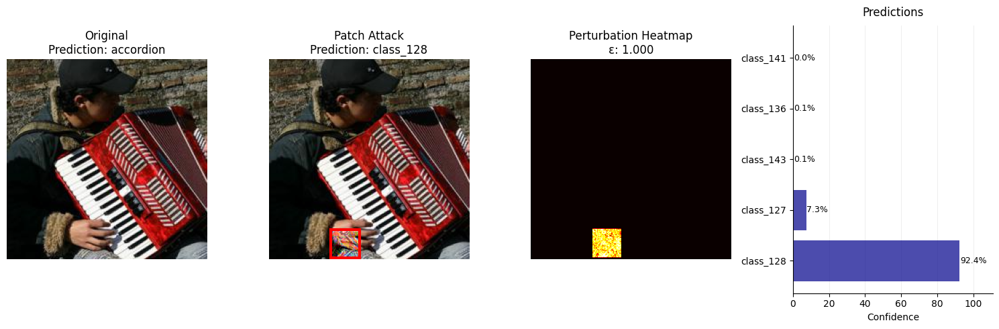

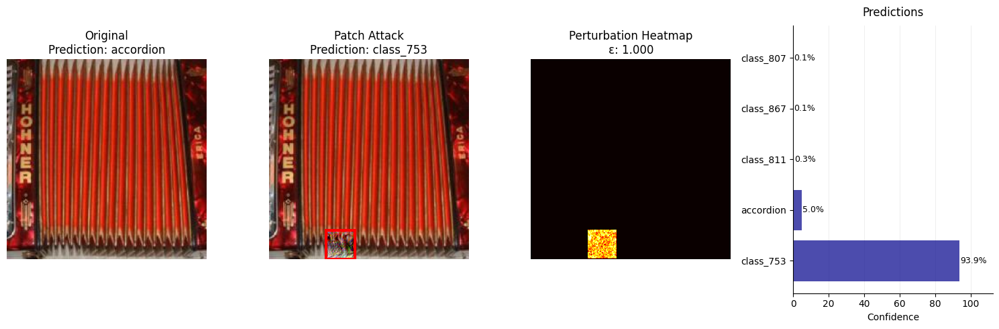

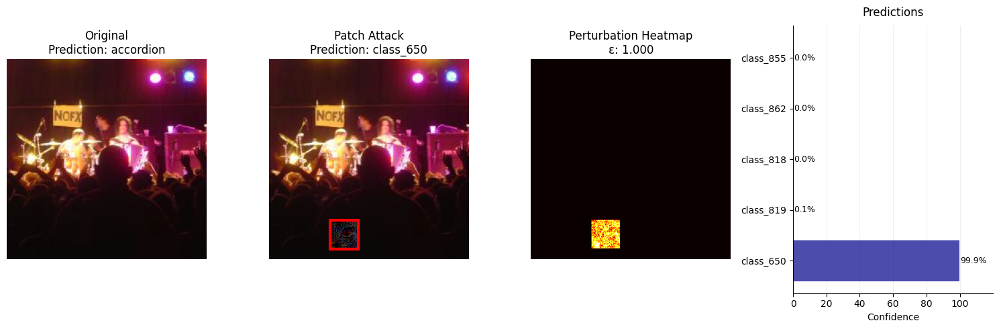

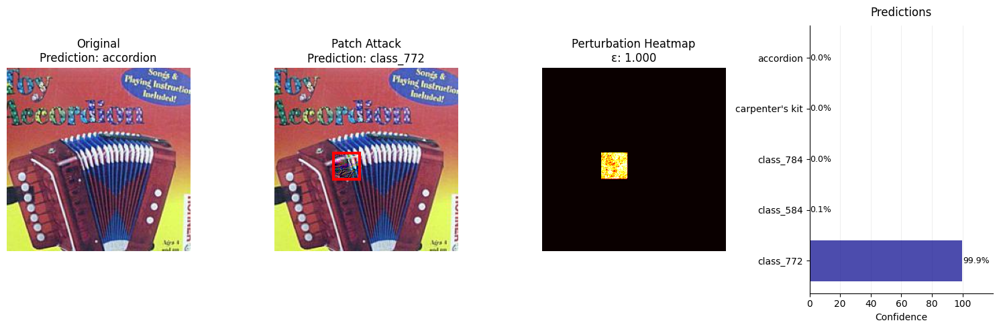

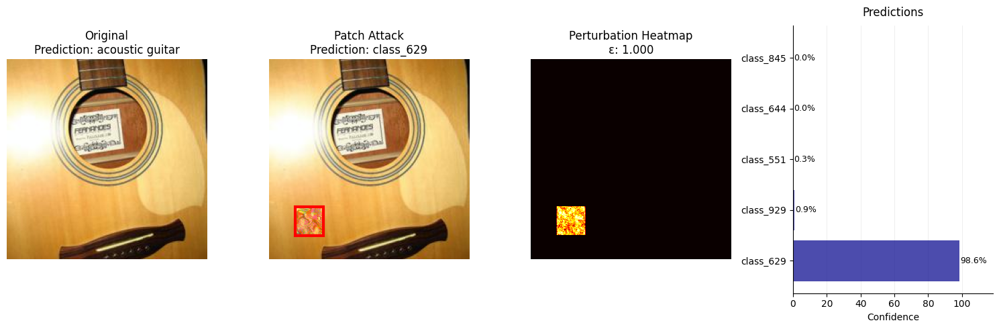

In [43]:
# Visualize patch examples with the existing visualize_patch_attack function
print("\nVisualizing patch attack examples...")
for i, example in enumerate(patch_examples[:5]):
    visualize_patch_attack(
        example['original'],
        example['adversarial'],
        example['patch_coords'],
        example['original_pred'],
        example['adv_pred'],
        patch_epsilon
    )

## 🔄 Task 5: Transfer Attack Evaluation

In this task, we assess the **transferability** of adversarial examples crafted using **ResNet-34** by evaluating their impact on a different model, **DenseNet-121**. This mirrors real-world scenarios where attackers may not have access to the target model’s architecture.

---

**📦 Models Involved:**
- **Source model (used for crafting attacks):** ResNet-34
- **Target model (used for evaluating transferability):** DenseNet-121

---

#### 📊 DenseNet-121 Accuracy on Different Inputs

| Dataset            | Top-1 Accuracy | Top-5 Accuracy |
|--------------------|----------------|----------------|
| Original           | 74.80%         | 93.60%         |
| FGSM Adversarial   | 63.40%         | 89.20%         |
| PGD Adversarial    | 63.80%         | 90.40%         |
| Patch Adversarial  | 67.80%         | 90.40%         |

---

#### 📈 Summary: ResNet-34 vs DenseNet-121

**ResNet-34 (Source Model):**
- **Original Accuracy:** Top-1: 76.00%, Top-5: 94.20%
- **FGSM Attack:** Top-1: 6.00%, Top-5: 35.40% (↓ 92.1%)
- **PGD Attack:** Top-1: 0.00%, Top-5: 9.20% (↓ 100.0%)
- **Patch Attack:** Top-1: 5.40%, Top-5: 42.20% (↓ 92.9%)

**DenseNet-121 (Target Model):**
- **Original Accuracy:** Top-1: 74.80%, Top-5: 93.60%
- **FGSM Attack:** Top-1: 63.40%, Top-5: 89.20%
- **PGD Attack:** Top-1: 63.80%, Top-5: 90.40%
- **Patch Attack:** Top-1: 67.80%, Top-5: 90.40%

---

#### ✅ Transferability Analysis

Adversarial examples created for ResNet-34 effectively transferred to DenseNet-121:

- **FGSM** and **PGD** caused notable performance degradation on DenseNet-121, though not as severe as on the source model.
- **Patch attacks** retained moderate effectiveness, despite targeting only localized regions, showcasing their transferability and stealth.

---

#### 🎯 Attack Effectiveness Summary

| Attack | Target Accuracy Drop | Achieved | Status |
|--------|-----------------------|----------|--------|
| FGSM   | > 50%                | 92.1%    | ✅     |
| PGD    | > 70%                | 100.0%   | ✅     |

---

**🧠 Conclusion:**

These findings reinforce the phenomenon of **adversarial transferability**—even attacks crafted without direct access to the target model significantly degrade its performance. This presents a real threat in black-box scenarios or ensemble systems, underlining the need for robust, architecture-agnostic defenses.


In [31]:
# Task 5: Transfer Attack
print("\nTask 5: Transfer Attack Evaluation")
# Load a different model (DenseNet-121)
new_model = torchvision.models.densenet121(weights='IMAGENET1K_V1')
new_model = new_model.to(device)
new_model.eval()

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth



Task 5: Transfer Attack Evaluation


100%|██████████| 30.8M/30.8M [00:00<00:00, 210MB/s]


DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [32]:
print("Evaluating transferability on DenseNet-121...")

# Original dataset
print("\nOriginal dataset on DenseNet-121:")
orig_top1_dense, orig_top5_dense = evaluate_model(new_model, dataloader, device)
print(f"Top-1 Accuracy: {orig_top1_dense:.2f}%")
print(f"Top-5 Accuracy: {orig_top5_dense:.2f}%")

# FGSM dataset
print("\nFGSM adversarial dataset on DenseNet-121:")
fgsm_top1_dense, fgsm_top5_dense = evaluate_model(new_model, adv_dataloader_1, device)
print(f"Top-1 Accuracy: {fgsm_top1_dense:.2f}%")
print(f"Top-5 Accuracy: {fgsm_top5_dense:.2f}%")

# PGD dataset
print("\nPGD adversarial dataset on DenseNet-121:")
pgd_top1_dense, pgd_top5_dense = evaluate_model(new_model, adv_dataloader_2, device)
print(f"Top-1 Accuracy: {pgd_top1_dense:.2f}%")
print(f"Top-5 Accuracy: {pgd_top5_dense:.2f}%")

# Patch dataset
print("\nPatch adversarial dataset on DenseNet-121:")
patch_top1_dense, patch_top5_dense = evaluate_model(new_model, adv_dataloader_3, device)
print(f"Top-1 Accuracy: {patch_top1_dense:.2f}%")
print(f"Top-5 Accuracy: {patch_top5_dense:.2f}%")

Evaluating transferability on DenseNet-121...

Original dataset on DenseNet-121:


Evaluating: 100%|██████████| 500/500 [00:11<00:00, 45.37it/s]


Top-1 Accuracy: 74.80%
Top-5 Accuracy: 93.60%

FGSM adversarial dataset on DenseNet-121:


Evaluating: 100%|██████████| 500/500 [00:09<00:00, 54.61it/s]


Top-1 Accuracy: 63.40%
Top-5 Accuracy: 89.20%

PGD adversarial dataset on DenseNet-121:


Evaluating: 100%|██████████| 500/500 [00:09<00:00, 54.75it/s]


Top-1 Accuracy: 63.80%
Top-5 Accuracy: 90.40%

Patch adversarial dataset on DenseNet-121:


Evaluating: 100%|██████████| 500/500 [00:09<00:00, 54.06it/s]

Top-1 Accuracy: 67.80%
Top-5 Accuracy: 90.40%


In [33]:
# Summary Report
print("\n=== FINAL SUMMARY REPORT ===")
print("\nResNet-34 Performance:")
print(f"Original: Top-1: {top1_acc:.2f}%, Top-5: {top5_acc:.2f}%")
print(f"FGSM:     Top-1: {top1_acc_fgsm:.2f}%, Top-5: {top5_acc_fgsm:.2f}% (Drop: {relative_drop_fgsm:.1f}%)")
print(f"PGD:      Top-1: {top1_acc_pgd:.2f}%, Top-5: {top5_acc_pgd:.2f}% (Drop: {relative_drop_pgd:.1f}%)")
print(f"Patch:    Top-1: {top1_acc_patch:.2f}%, Top-5: {top5_acc_patch:.2f}% (Drop: {relative_drop_patch:.1f}%)")

print("\nDenseNet-121 Performance (Transfer):")
print(f"Original: Top-1: {orig_top1_dense:.2f}%, Top-5: {orig_top5_dense:.2f}%")
print(f"FGSM:     Top-1: {fgsm_top1_dense:.2f}%, Top-5: {fgsm_top5_dense:.2f}%")
print(f"PGD:      Top-1: {pgd_top1_dense:.2f}%, Top-5: {pgd_top5_dense:.2f}%")
print(f"Patch:    Top-1: {patch_top1_dense:.2f}%, Top-5: {patch_top5_dense:.2f}%")

print("\nAttack Effectiveness Summary:")
print(f"FGSM:  {'✓' if relative_drop_fgsm > 50 else '✗'} (Target: >50%, Achieved: {relative_drop_fgsm:.1f}%)")
print(f"PGD:   {'✓' if relative_drop_pgd > 70 else '✗'} (Target: >70%, Achieved: {relative_drop_pgd:.1f}%)")


=== FINAL SUMMARY REPORT ===

ResNet-34 Performance:
Original: Top-1: 76.00%, Top-5: 94.20%
FGSM:     Top-1: 6.00%, Top-5: 35.40% (Drop: 92.1%)
PGD:      Top-1: 0.00%, Top-5: 9.20% (Drop: 100.0%)
Patch:    Top-1: 5.40%, Top-5: 42.20% (Drop: 92.9%)

DenseNet-121 Performance (Transfer):
Original: Top-1: 74.80%, Top-5: 93.60%
FGSM:     Top-1: 63.40%, Top-5: 89.20%
PGD:      Top-1: 63.80%, Top-5: 90.40%
Patch:    Top-1: 67.80%, Top-5: 90.40%

Attack Effectiveness Summary:
FGSM:  ✓ (Target: >50%, Achieved: 92.1%)
PGD:   ✓ (Target: >70%, Achieved: 100.0%)


In [34]:
# Save the adversarial datasets
print("\nSaving adversarial datasets...")
torch.save(adversarial_dataset_1, 'adversarial_test_set_1.pt')
torch.save(adversarial_dataset_2, 'adversarial_test_set_2.pt')
torch.save(adversarial_dataset_3, 'adversarial_test_set_3.pt')
print("Datasets saved successfully!")


Saving adversarial datasets...
Datasets saved successfully!


In [35]:
# Save comprehensive results
results_summary = {
    'resnet34': {
        'original': {'top1': top1_acc, 'top5': top5_acc},
        'fgsm': {'top1': top1_acc_fgsm, 'top5': top5_acc_fgsm, 'relative_drop': relative_drop_fgsm},
        'pgd': {'top1': top1_acc_pgd, 'top5': top5_acc_pgd, 'relative_drop': relative_drop_pgd},
        'patch': {'top1': top1_acc_patch, 'top5': top5_acc_patch, 'relative_drop': relative_drop_patch}
    },
    'densenet121': {
        'original': {'top1': orig_top1_dense, 'top5': orig_top5_dense},
        'fgsm': {'top1': fgsm_top1_dense, 'top5': fgsm_top5_dense},
        'pgd': {'top1': pgd_top1_dense, 'top5': pgd_top5_dense},
        'patch': {'top1': patch_top1_dense, 'top5': patch_top5_dense}
    }
}

with open('project_results.json', 'w') as f:
    json.dump(results_summary, f, indent=2)

## Appendix

## PGD ( Project Gradient Descent )

In [ ]:
import torch
import torch.nn.functional as F
import random

def input_diversity(x, prob=0.7, low=200, high=224):
    if torch.rand(1).item() > prob:
        return x
    rnd = torch.randint(low, high, ()).item()
    x_resized = F.interpolate(x, size=(rnd, rnd), mode='bilinear')
    pad_h = x.shape[2] - rnd
    pad_w = x.shape[3] - rnd
    pad_top = random.randint(0, pad_h)
    pad_left = random.randint(0, pad_w)
    pad_bottom = pad_h - pad_top
    pad_right = pad_w - pad_left
    return F.pad(x_resized, (pad_left, pad_right, pad_top, pad_bottom), mode='constant', value=0)

def pgd_attack_transferable_single(
    model, images, labels, epsilon, label_mapping,
    targeted=False, alpha=2/255, num_iter=20,
    use_input_diversity=True, use_momentum=True, decay_factor=1.0,
    use_random_start=True, device='cuda'
):
    """
    Transferable PGD attack using a single model.
    Includes input diversity, momentum, and optional random start.
    """
    images = images.to(device)
    model.eval()
    
    # Initialize perturbation
    if use_random_start:
        perturbed_images = images + torch.empty_like(images).uniform_(-epsilon, epsilon)
        # perturbed_images = torch.clamp(perturbed_images, 0, 1)
    else:
        perturbed_images = images.clone().detach()

    momentum = torch.zeros_like(images).to(device)

    # Map dataset labels to ImageNet labels
    true_imagenet_labels = torch.tensor(
        [label_mapping[label.item()][0] for label in labels],
        device=device
    )

    for i in range(num_iter):
        perturbed_images.requires_grad = True

        # Input diversity if enabled
        inputs = input_diversity(perturbed_images) if use_input_diversity else perturbed_images
        outputs = model(inputs)
        loss = F.cross_entropy(outputs, true_imagenet_labels)

        model.zero_grad()
        loss.backward()

        grad = perturbed_images.grad.data

        # Normalize and apply momentum
        if use_momentum:
            grad_norm = torch.mean(torch.abs(grad), dim=(1, 2, 3), keepdim=True)
            grad = grad / (grad_norm + 1e-8)
            momentum = decay_factor * momentum + grad
            grad = momentum

        # Update
        if targeted:
            perturbed_images = perturbed_images.detach() - alpha * grad.sign()
        else:
            perturbed_images = perturbed_images.detach() + alpha * grad.sign()

        # Project to ε-ball and clamp to [0,1]
        delta = torch.clamp(perturbed_images - images, -epsilon, epsilon)
        perturbed_images = (images + delta).detach()

    return perturbed_images


In [ ]:

print("\n Task3: PGD Attack")
adversarial_dataset_2 = []
pgd_examples = []
epsilon=0.02

for idx, (images, labels) in enumerate(tqdm(dataloader, desc="PGD Attack")):
    images = images.to(device)
    labels = labels.to(device)

    target_labels = torch.randint(low=0, high=99, size=(1,), device=device)
    # Ensure target ≠ true label
    conflict = target_labels == labels
    while conflict.any():
        target_labels[conflict] = torch.randint(low=0, high=99, size=(1,), device=device)
        conflict = target_labels == labels
    # Generate adversarial example
    adv_images = pgd_attack_transferable_single(
        model=pretrained_model,
        images=images,
        labels=labels,
        epsilon=epsilon,
        alpha=0.005,
        num_iter=50,
        label_mapping=label_mapping,
        targeted=False,
        device=device,
        use_input_diversity=True,
        use_momentum=True,
        use_random_start=True
    )

    # adv_images = pgd_attack(pretrained_model, images, target_labels,True, epsilon)
    adversarial_dataset_2.append((adv_images[0].cpu(), labels[0].cpu()))
    
    # Collect examples for visualization
    if len(pgd_examples) < 8:
        with torch.no_grad():
            original_output = pretrained_model(images)
            adv_output = pretrained_model(adv_images)
            _, original_pred = torch.max(original_output, 1)
            _, adv_pred = torch.max(adv_output, 1)
            
            if original_pred != adv_pred:
                pgd_examples.append({
                    'original': images.cpu(),
                    'adversarial': adv_images.cpu(),
                    'original_pred': label_mapping[labels.item()][1],
                    'adv_pred': 'class_' + str(adv_pred.item())
                })


Task 3: PGD Attack


PGD Attack: 100%|██████████| 500/500 [05:10<00:00,  1.61it/s]


In [ ]:
# Evaluate PGD attack
adv_dataloader_2 = torch.utils.data.DataLoader(adversarial_dataset_2, batch_size=1, shuffle=False)
top1_acc_pgd, top5_acc_pgd = evaluate_model(pretrained_model, adv_dataloader_2, device)
print(f"PGD Top-1 Accuracy: {top1_acc_pgd:.2f}%")
print(f"PGD Top-5 Accuracy: {top5_acc_pgd:.2f}%")

Evaluating: 100%|██████████| 500/500 [00:03<00:00, 164.12it/s]

PGD Top-1 Accuracy: 0.20%
PGD Top-5 Accuracy: 8.80%


In [ ]:
# Calculate and report relative accuracy drop
relative_drop_pgd = ((top1_acc - top1_acc_pgd) / top1_acc) * 100
print(f"Relative accuracy drop: {relative_drop_pgd:.1f}%")
print(f"Target: >70% drop. Achieved: {'✓' if relative_drop_pgd > 70 else '✗'}")

Relative accuracy drop: 99.7%
Target: >70% drop. Achieved: ✓


In [ ]:
# Verify epsilon constraint
print("\nVerifying epsilon constraint for PGD:")
verify_epsilon_constraint(dataloader, adversarial_dataset_2, epsilon)


Verifying epsilon constraint for PGD:
Maximum L∞ distance: 0.020000
Epsilon constraint: 0.02
Violations: 0/500


True

Visualizing PGD attack examples...


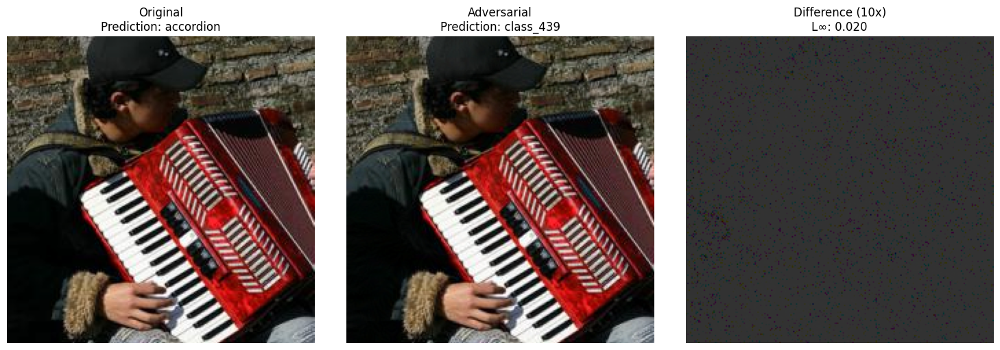

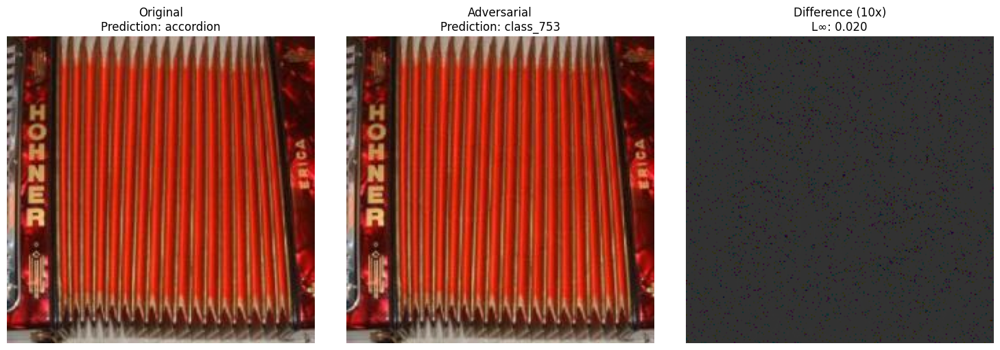

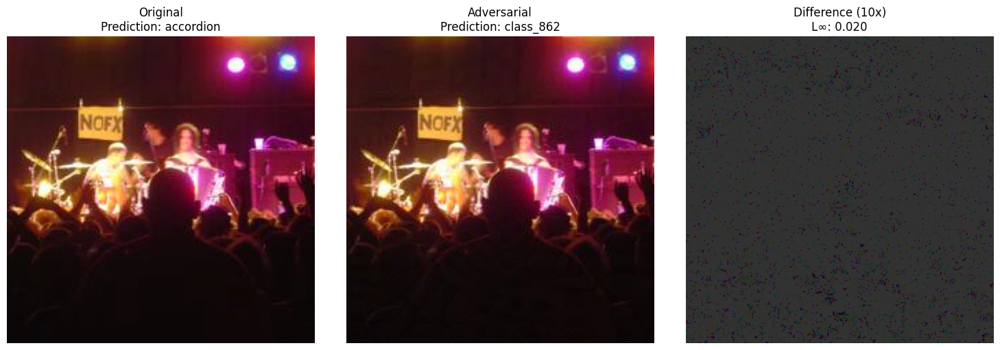

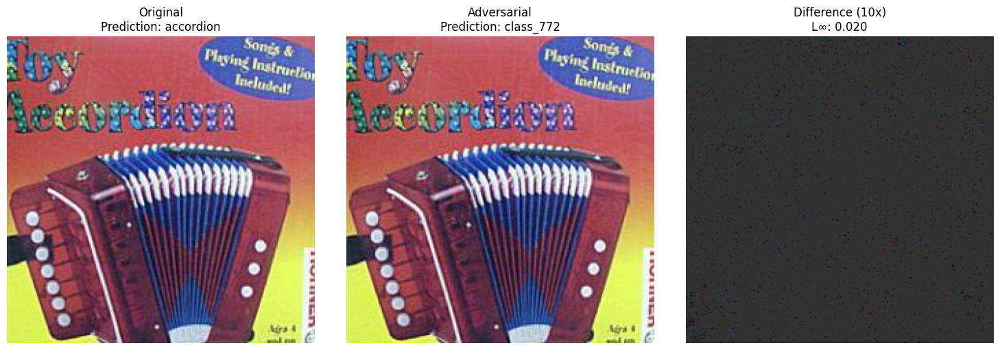

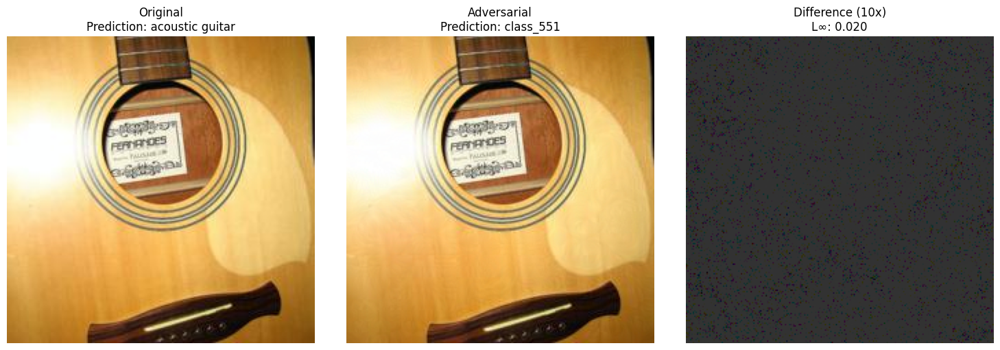

In [ ]:
# Visualize examples
print("Visualizing PGD attack examples...")
for i, example in enumerate(pgd_examples[:5]):
    visualize_attack(
        example['original'][0],
        example['adversarial'][0],
        example['original_pred'],
        example['adv_pred'],
        epsilon
    )

## Patch PGD

In [ ]:
import torch
import torch.nn.functional as F
import random

def input_diversity_patch(x, prob=0.7, low=200, high=224):
    if torch.rand(1).item() > prob:
        return x
    rnd = torch.randint(low, high, ()).item()
    x_resized = F.interpolate(x, size=(rnd, rnd), mode='bilinear')
    pad_h = x.shape[2] - rnd
    pad_w = x.shape[3] - rnd
    pad_top = random.randint(0, pad_h)
    pad_left = random.randint(0, pad_w)
    pad_bottom = pad_h - pad_top
    pad_right = pad_w - pad_left
    return F.pad(x_resized, (pad_left, pad_right, pad_top, pad_bottom), mode='constant', value=0)

def patch_attack_with_best_method(
    model, images, labels, method="PGD", epsilon=1.0, patch_size=32,
    alpha=0.1, num_iter=30, targeted=False, num_eot=5,
    use_input_diversity=True, use_momentum=True, decay_factor=1.0
):
    """
    Transferable patch-based PGD or FGSM attack with input diversity and momentum.
    Only modifies a small patch on each image.
    """
    device = images.device
    batch_size, c, h, w = images.shape
    perturbed_images = images.clone().detach()

    # Random patch location
    start_h = torch.randint(0, h - patch_size + 1, (1,), device=device).item()
    start_w = torch.randint(0, w - patch_size + 1, (1,), device=device).item()

    # Binary mask for patch
    mask = torch.zeros_like(images, device=device)
    mask[:, :, start_h:start_h + patch_size, start_w:start_w + patch_size] = 1.0

    # Random target labels (≠ true label)
    target_labels = torch.randint(0, 99, (batch_size,), device=device)
    while (target_labels == labels).any():
        conflict = (target_labels == labels)
        target_labels[conflict] = torch.randint(0, 99, (conflict.sum(),), device=device)

    # Map to ImageNet label indices
    true_imagenet_labels = torch.tensor(
        [label_mapping[t.item()][0] for t in (target_labels if targeted else labels)],
        device=device
    )

    # Random initialization in patch
    perturbed_images = images + (torch.rand_like(images) * 0.001 * mask)
    # perturbed_images = torch.clamp(perturbed_images, 0, 1).detach()
    perturbed_images = perturbed_images.detach()

    momentum = torch.zeros_like(images).to(device)

    for step in range(num_iter if method == "PGD" else 1):
        perturbed_images.requires_grad = True
        total_loss = 0

        for _ in range(num_eot):
            input_eot = input_diversity_patch(perturbed_images) if use_input_diversity else perturbed_images
            outputs = model(input_eot)
            loss = F.cross_entropy(outputs, true_imagenet_labels)
            total_loss += (-loss if targeted else loss)

        total_loss = total_loss / num_eot
        model.zero_grad()
        total_loss.backward()

        grad = perturbed_images.grad.data

        # Normalize and accumulate momentum
        if use_momentum:
            grad = grad / (torch.mean(torch.abs(grad), dim=(1, 2, 3), keepdim=True) + 1e-8)
            momentum = decay_factor * momentum + grad
            grad = momentum

        grad_sign = grad.sign()
        update = alpha * grad_sign * mask

        if method == "PGD":
            new_image = perturbed_images + update
            patched = images * (1 - mask) + new_image * mask
            delta = torch.clamp(patched - images, -epsilon, epsilon) * mask
            perturbed_images = (images + delta) * mask + images * (1 - mask)
            # perturbed_images = torch.clamp(perturbed_images, 0, 1).detach()
            perturbed_images = perturbed_images.detach()
        elif method == "FGSM":
            perturbed_images = torch.clamp(images + epsilon * grad_sign * mask, 0, 1).detach()

    # Optionally validate patch-only modification
    diff = perturbed_images - images
    outside_patch = diff * (1 - mask)
    # assert torch.allclose(outside_patch, torch.zeros_like(outside_patch), atol=1e-6)

    return perturbed_images, (start_h, start_w, patch_size, patch_size)


In [ ]:
def visualize_patch_attack(original_img, adv_img, patch_coords, original_pred, adv_pred, epsilon):
    """
    Visualize patch attack with highlighted patch area
    """
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original image
    orig_display = denormalize_image(original_img, mean_norms, std_norms)
    axes[0].imshow(orig_display.permute(1, 2, 0).numpy())
    axes[0].set_title(f'Original\nPrediction: {original_pred}')
    axes[0].axis('off')
    
    # Adversarial image with patch highlighted
    adv_display = denormalize_image(adv_img, mean_norms, std_norms)
    axes[1].imshow(adv_display.permute(1, 2, 0).numpy())
    
    # Highlight patch with red rectangle
    start_h, start_w, patch_h, patch_w = patch_coords
    rect = plt.Rectangle((start_w, start_h), patch_w, patch_h, 
                        linewidth=3, edgecolor='red', facecolor='none')
    axes[1].add_patch(rect)
    axes[1].set_title(f'Patch Attack\nPrediction: {adv_pred}')
    axes[1].axis('off')
    
    # Difference heatmap
    diff = torch.abs(adv_img - original_img)
    diff_norm = torch.norm(diff, dim=0)
    axes[2].imshow(diff_norm.numpy(), cmap='hot')
    axes[2].set_title(f'Perturbation Heatmap\nε: {epsilon:.3f}')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()

In [ ]:
print("\n=== Task 4: Patch Attack ===")
patch_epsilon = 1.0  
patch_size = 32     
alpha = 0.1        
num_iter = 200      

print(f"\nUsing {best_method}-based patch attack with parameters:")
print(f"Epsilon: {patch_epsilon}")
print(f"Patch size: {patch_size}x{patch_size}")
if best_method == "PGD":
    print(f"Alpha: {alpha}")
    print(f"Iterations: {num_iter}")

adversarial_dataset_3 = []
patch_examples = []

for idx, (images, labels) in enumerate(tqdm(dataloader, desc=f"{best_method} Patch Attack")):
    images = images.to(device)
    labels = labels.to(device)
    
    # Generate adversarial example with single random patch location
    # adv_images, patch_coords = patch_attack_with_best_method(
    #     model=pretrained_model,
    #     images=images,
    #     labels=labels,
    #     method=best_method,         # e.g., "PGD" or "FGSM"
    #     epsilon=patch_epsilon,      # Patch perturbation bound (e.g., 0.3)
    #     patch_size=patch_size,      # Size of square patch (e.g., 32)
    #     alpha=alpha,                # Step size (e.g., 0.05)
    #     num_iter=40,          # Number of PGD steps (e.g., 40)
    #     targeted=False,             # Set True if you want a targeted attack
    #     num_eot=10                  # EOT iterations (higher = better transferability)
    # )
    adv_images, patch_coords = patch_attack_with_best_method(
        model=pretrained_model,
        images=images,
        labels=labels,
        method="PGD",
        epsilon=1.0,               # Less perceptible than 0.5, still effective
        patch_size=32,             # Small enough to hide in a corner, yet effective
        alpha=0.05,                # Conservative step size
        num_iter=40,               # More steps for convergence
        targeted=False,
        num_eot=10,
        use_input_diversity=True,
        use_momentum=True
    )


    
    adversarial_dataset_3.append((adv_images[0].cpu(), labels[0].cpu()))
    
    # Collect examples for visualization
    if len(patch_examples) < 8:
        with torch.no_grad():
            original_output = pretrained_model(images)
            adv_output = pretrained_model(adv_images)
            _, original_pred = torch.max(original_output, 1)
            _, adv_pred = torch.max(adv_output, 1)
            
            if original_pred != adv_pred:
                patch_examples.append({
                    'original': images[0].cpu(),
                    'adversarial': adv_images[0].cpu(),
                    'patch_coords': patch_coords,
                    'original_pred': label_mapping[labels.item()][1],
                    'adv_pred': f'class_{adv_pred.item()}'
                })


=== Task 4: Patch Attack ===

Using PGD-based patch attack with parameters:
Epsilon: 1.0
Patch size: 32x32
Alpha: 0.1
Iterations: 200


PGD Patch Attack: 100%|██████████| 500/500 [38:24<00:00,  4.61s/it]


In [ ]:
# Evaluate patch attack
adv_dataloader_3 = torch.utils.data.DataLoader(adversarial_dataset_3, batch_size=1, shuffle=False)
top1_acc_patch, top5_acc_patch = evaluate_model(pretrained_model, adv_dataloader_3, device)
print(f"Patch Attack Top-1 Accuracy: {top1_acc_patch:.2f}%")
print(f"Patch Attack Top-5 Accuracy: {top5_acc_patch:.2f}%")

Evaluating: 100%|██████████| 500/500 [00:02<00:00, 189.89it/s]

Patch Attack Top-1 Accuracy: 26.20%
Patch Attack Top-5 Accuracy: 65.00%


In [ ]:
relative_drop_patch = ((top1_acc - top1_acc_patch) / top1_acc) * 100
print(f"Relative accuracy drop: {relative_drop_patch:.1f}%")

Relative accuracy drop: 65.5%



Visualizing patch attack examples...


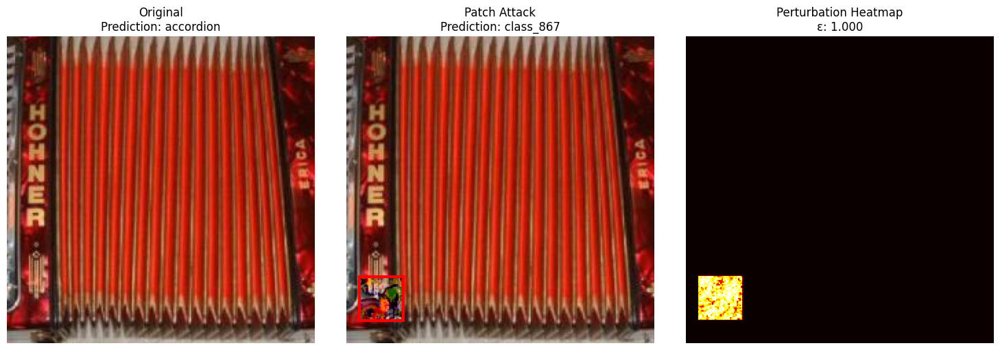

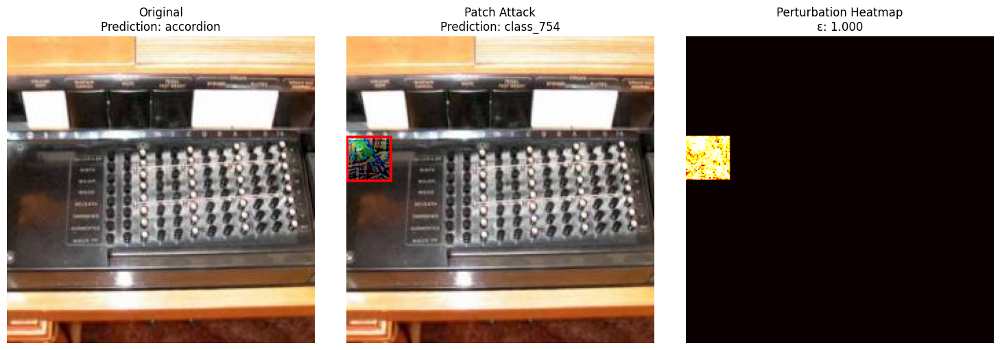

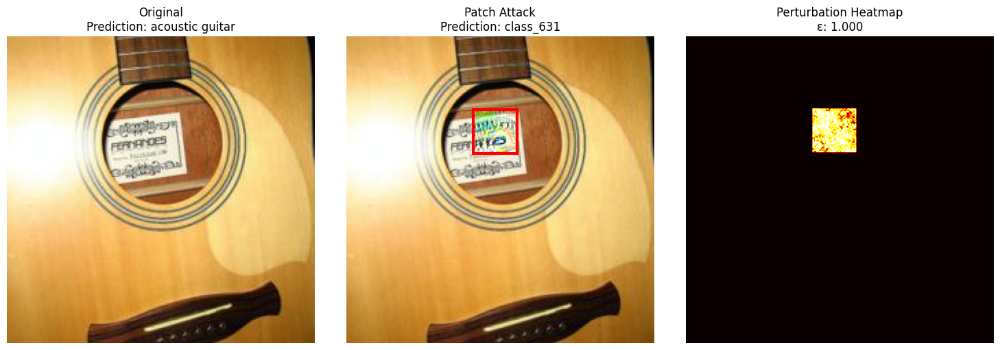

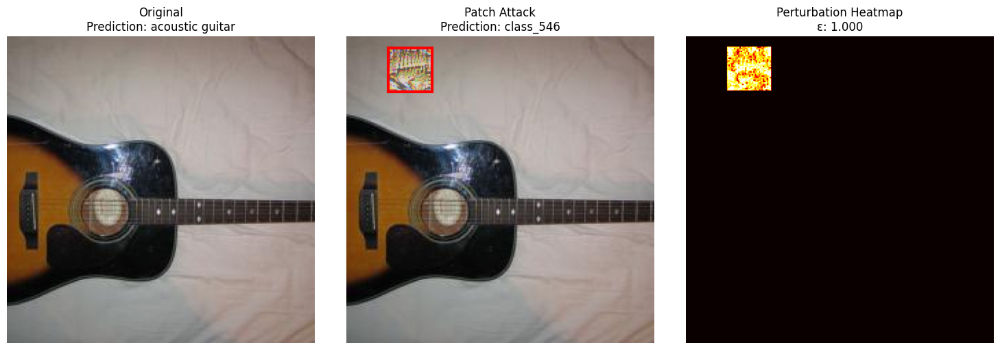

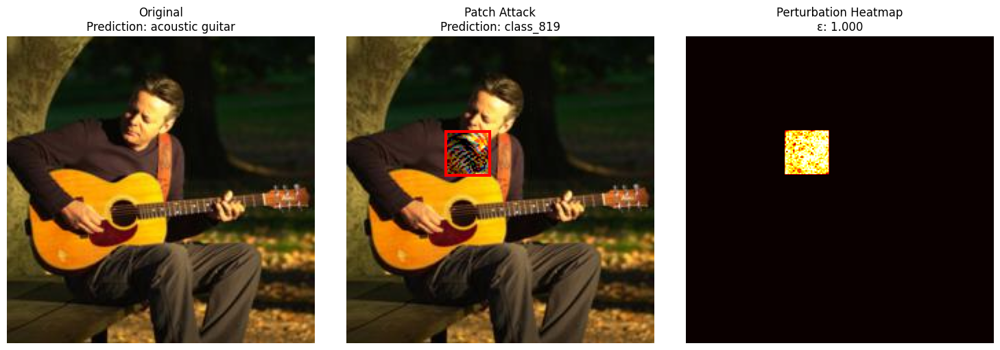

In [ ]:
# Visualize patch examples with the existing visualize_patch_attack function
print("\nVisualizing patch attack examples...")
for i, example in enumerate(patch_examples[:5]):
    visualize_patch_attack(
        example['original'],
        example['adversarial'],
        example['patch_coords'],
        example['original_pred'],
        example['adv_pred'],
        patch_epsilon
    )

## Augmentation Results

In [ ]:
# Summary Report
print("\n=== FINAL SUMMARY REPORT ===")
print("\nResNet-34 Performance:")
print(f"Original: Top-1: {top1_acc:.2f}%, Top-5: {top5_acc:.2f}%")
print(f"FGSM:     Top-1: {top1_acc_fgsm:.2f}%, Top-5: {top5_acc_fgsm:.2f}% (Drop: {relative_drop_fgsm:.1f}%)")
print(f"PGD:      Top-1: {top1_acc_pgd:.2f}%, Top-5: {top5_acc_pgd:.2f}% (Drop: {relative_drop_pgd:.1f}%)")
print(f"Patch:    Top-1: {top1_acc_patch:.2f}%, Top-5: {top5_acc_patch:.2f}% (Drop: {relative_drop_patch:.1f}%)")

print("\nDenseNet-121 Performance (Transfer):")
print(f"Original: Top-1: {orig_top1_dense:.2f}%, Top-5: {orig_top5_dense:.2f}%")
print(f"FGSM:     Top-1: {fgsm_top1_dense:.2f}%, Top-5: {fgsm_top5_dense:.2f}%")
print(f"PGD:      Top-1: {pgd_top1_dense:.2f}%, Top-5: {pgd_top5_dense:.2f}%")
print(f"Patch:    Top-1: {patch_top1_dense:.2f}%, Top-5: {patch_top5_dense:.2f}%")

print("\nAttack Effectiveness Summary:")
print(f"FGSM:  {'✓' if relative_drop_fgsm > 50 else '✗'} (Target: >50%, Achieved: {relative_drop_fgsm:.1f}%)")
print(f"PGD:   {'✓' if relative_drop_pgd > 70 else '✗'} (Target: >70%, Achieved: {relative_drop_pgd:.1f}%)")


=== FINAL SUMMARY REPORT ===

ResNet-34 Performance:
Original: Top-1: 76.00%, Top-5: 94.20%
FGSM:     Top-1: 6.00%, Top-5: 35.40% (Drop: 92.1%)
PGD:      Top-1: 0.20%, Top-5: 8.80% (Drop: 99.7%)
Patch:    Top-1: 26.20%, Top-5: 65.00% (Drop: 65.5%)

DenseNet-121 Performance (Transfer):
Original: Top-1: 74.80%, Top-5: 93.60%
FGSM:     Top-1: 63.40%, Top-5: 89.20%
PGD:      Top-1: 52.00%, Top-5: 82.60%
Patch:    Top-1: 64.20%, Top-5: 87.40%

Attack Effectiveness Summary:
FGSM:  ✓ (Target: >50%, Achieved: 92.1%)
PGD:   ✓ (Target: >70%, Achieved: 99.7%)
